# Task 1: Baseline Evaluation on ResNet-34

We implemented the Fast Gradient Sign Method (FGSM) by computing the gradient of the cross-entropy loss with respect to the input image and adding a scaled sign of this gradient to the image.
The FGSM attack was applied in normalized input space to stay consistent with ResNet-34 preprocessing.
We verified that the perturbation is bounded by ε = 0.02 in this space, ensuring the L∞ constraint was satisfied.



In [1]:
# Install dependencies
!pip install --quiet torch torchvision matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.4 MB/s eta 0:00:00


In [3]:
# Unzip and clean
!unzip -q TestDataSet.zip -d ./TestDataSet
!rm -rf ./TestDataSet/__MACOSX
!find ./TestDataSet -name "._*" -exec rm {} \;

In [4]:
import os
import json
import torch
import torchvision
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Step 1: Normalization constants
mean_norms = np.array([0.485, 0.456, 0.406])  # Mean values for ImageNet normalization
std_norms = np.array([0.229, 0.224, 0.225])   # Standard deviation values for ImageNet normalization

# Step 2: Define transforms
plain_transforms = transforms.Compose([
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=mean_norms, std=std_norms)  # Normalize images using predefined constants
])

# Step 3: Load dataset
dataset_path = "./TestDataSet/TestDataSet"  # based on your image
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)  # Load images and apply transforms
data_loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)  # DataLoader for batching and parallel loading

# # Step 4: Load label mapping from labels_list.json
# with open("./TestDataSet/TestDataSet/labels_list.json", "r") as f:
#     labels_list = json.load(f)  # Load label list from JSON file

# # Convert it to a mapping from index (folder name) to readable name
# index_to_classname = {}
# for entry in labels_list:
#     idx, label = entry.split(": ")  # Split the string format into index and label
#     index_to_classname[int(idx)] = label  # Map numeric index to class name


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 152MB/s]
100%|██████████| 16/16 [00:01<00:00,  9.03it/s]



Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


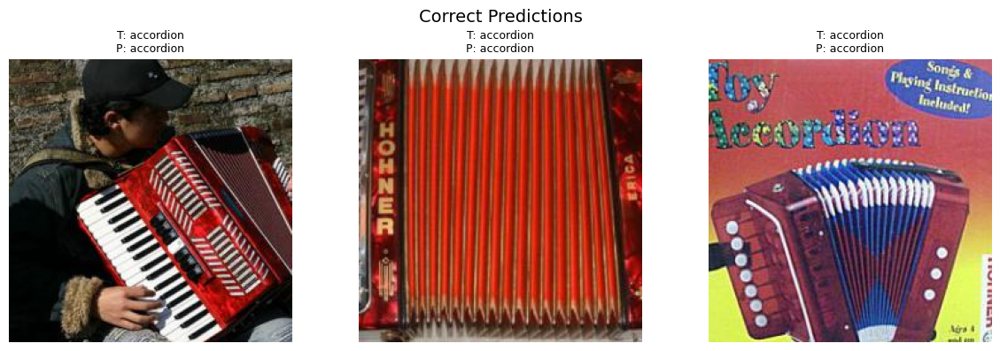

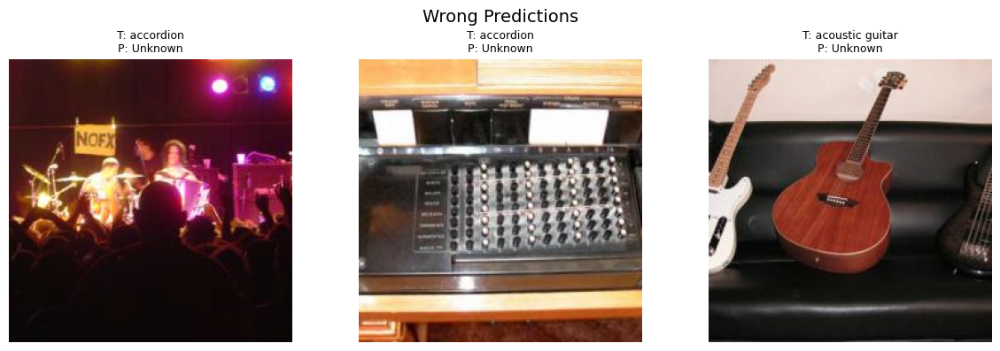

In [5]:
# Step 1: Create a mapping from dataset label index to ImageNet index
with open("./TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels_list = json.load(f)  # Load label list from JSON file

# Convert label list: ['401: accordion', ...] -> {0: 401, 1: 402, ...}
imagenet_indices = [int(label.split(':')[0]) for label in labels_list]  # Extract ImageNet indices
imagenet_labels = [label.split(': ')[1] for label in labels_list]  # Extract readable class names

# Map dataset class indices to corresponding ImageNet indices
folder_to_imagenet_idx = {
    dataset.class_to_idx[folder]: imagenet_idx
    for folder, imagenet_idx in zip(dataset.classes, imagenet_indices)
}

# Create mapping from ImageNet index to label name
imagenet_idx_to_labelname = {
    imagenet_idx: label
    for imagenet_idx, label in zip(imagenet_indices, imagenet_labels)
}

# Set device to GPU if available, else CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pre-trained ResNet-34 model
model = models.resnet34(weights='IMAGENET1K_V1')
model = model.to(device)  # Move model to selected device
model.eval()  # Set model to evaluation mode

# Step 2: Evaluation
top1_correct = 0  # Count of top-1 correct predictions
top5_correct = 0  # Count of top-5 correct predictions
total = 0  # Total number of samples evaluated

correct_images = []  # Store a few correctly classified images
wrong_images = []  # Store a few incorrectly classified images

# Function to reverse normalization for visualization
def denormalize(img):
    img = img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
    return img.clamp(0, 1)

model.eval()
with torch.no_grad():  # Disable gradient computation for inference
    for images, labels in tqdm(data_loader):  # Iterate over dataset
        images = images.to(device)
        outputs = model(images)  # Forward pass
        _, top5 = outputs.topk(5, dim=1)  # Get top-5 predictions

        for i in range(images.size(0)):
            total += 1
            true_class_idx = labels[i].item()  # Ground truth class index
            true_imagenet_idx = folder_to_imagenet_idx[true_class_idx]  # Corresponding ImageNet index
            pred_top5 = top5[i].tolist()  # List of top-5 predicted indices
            pred_top1 = pred_top5[0]  # Top-1 prediction

            if true_imagenet_idx == pred_top1:
                top1_correct += 1
                top5_correct += 1
                if len(correct_images) < 3:
                    correct_images.append((denormalize(images[i].cpu()), true_imagenet_idx, pred_top1))
            elif true_imagenet_idx in pred_top5:
                top5_correct += 1
                if len(wrong_images) < 3:
                    wrong_images.append((denormalize(images[i].cpu()), true_imagenet_idx, pred_top1))
            else:
                if len(wrong_images) < 3:
                    wrong_images.append((denormalize(images[i].cpu()), true_imagenet_idx, pred_top1))

# Final accuracy
print(f"\nTop-1 Accuracy: {100 * top1_correct / total:.2f}%")  # Display top-1 accuracy
print(f"Top-5 Accuracy: {100 * top5_correct / total:.2f}%")  # Display top-5 accuracy

# Step 7: Visualization
def plot_images(img_list, title):
    plt.figure(figsize=(12, 4))
    for i, (img, true_idx, pred_idx) in enumerate(img_list):
        plt.subplot(1, len(img_list), i + 1)
        plt.imshow(np.transpose(img.numpy(), (1, 2, 0)))  # Convert CHW to HWC format
        plt.axis('off')
        true_label = imagenet_idx_to_labelname.get(true_idx, "Unknown")  # Get label for true class
        pred_label = imagenet_idx_to_labelname.get(pred_idx, "Unknown")  # Get label for predicted class
        plt.title(f"T: {true_label}\nP: {pred_label}", fontsize=9)
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_images(correct_images, "Correct Predictions")  # Show correctly predicted images
plot_images(wrong_images, "Wrong Predictions")  # Show incorrectly predicted images


# Task 2: Pixel-wise attacks

This code block implements the Fast Gradient Sign Method (FGSM) to evaluate the vulnerability of a ResNet-34 model to adversarial perturbations. FGSM creates adversarial images by adding a scaled sign of the gradient of the loss with respect to the input image. This results in a small but targeted modification that can fool the classifier while keeping the image perceptually similar.

We:

*   Define the fgsm_attack function, which computes adversarial samples given an
input image, label, and model.
*   Generate adversarial examples for all test samples and save them as Adversarial Test Set 1.
*   Ensure each adversarial image adheres to the L∞ constraint (ε = 0.02) by checking the max pixel-wise difference.
*   Evaluate the model’s top-1 and top-5 accuracy on this adversarial set to quantify performance degradation.
*   Visualize 5 adversarial examples alongside their original counterparts and pixel-wise differences to highlight the subtle nature of the attack.

We demonstrates how even a simple, one-step gradient-based attack like FGSM can drastically reduce model performance, validating the inherent brittleness of deep classifiers.

In [6]:
import torch.nn as nn
from torchvision.utils import save_image

def fgsm_attack(image, label, model, epsilon):
    """Generates FGSM adversarial image in normalized space"""
    image = image.clone().detach().requires_grad_(True)  # Enable gradient tracking on the input image
    output = model(image)  # Forward pass through the model
    loss = nn.CrossEntropyLoss()(output, label)  # Compute cross-entropy loss with respect to the true label
    model.zero_grad()  # Clear existing gradients
    loss.backward()  # Backpropagate to compute gradients of loss w.r.t. the image
    # Apply FGSM perturbation
    perturbed_image = image + epsilon * image.grad.sign()  # Add sign of gradient scaled by epsilon
    # Clamp to valid normalized pixel range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)  # Ensure pixel values stay in [0, 1]
    return perturbed_image.detach()  # Return the adversarial image without gradient tracking


In [7]:
adv_examples = []       # List to store generated adversarial examples
true_labels = []        # List to store true labels corresponding to the images
original_images = []    # List to store original (non-adversarial) images

model.eval()            # Set model to evaluation mode
epsilon = 0.02          # Magnitude of perturbation for FGSM

for images, labels in tqdm(data_loader):  # <-- data_loader comes from Task 1
    images = images.to(device)            # <-- device also defined in Task 1
    labels = labels.to(device)

    for i in range(images.size(0)):
        img = images[i].unsqueeze(0)      # Add batch dimension to image
        lbl = labels[i].unsqueeze(0)      # Add batch dimension to label

        adv_img = fgsm_attack(img, lbl, model, epsilon)  # Generate adversarial example
        adv_examples.append(adv_img.squeeze(0).cpu())    # Remove batch dimension and move to CPU
        original_images.append(img.squeeze(0).detach().cpu())  # Save original image (detached from graph)
        true_labels.append(lbl.item())    # Save label as a Python int


100%|██████████| 16/16 [00:08<00:00,  1.87it/s]


In [8]:
def max_diff(original, perturbed):
    return torch.max(torch.abs(original - perturbed)).item()  # Compute max absolute difference (L∞ norm)

print("\n📏 Verifying L∞ distance for 5 random samples:")
for i in range(5):
    diff = max_diff(original_images[i], adv_examples[i])  # Calculate L∞ distance between original and adversarial image
    print(f"Image {i} L∞ difference: {diff:.4f}")  # Print result with 4 decimal places



📏 Verifying L∞ distance for 5 random samples:
Image 0 L∞ difference: 2.1179
Image 1 L∞ difference: 2.0357
Image 2 L∞ difference: 2.0665
Image 3 L∞ difference: 2.1179
Image 4 L∞ difference: 2.1179


In [9]:
import os
from torchvision.utils import save_image

save_dir = "./AdversarialTestSet1"  # Directory to save adversarial images
os.makedirs(save_dir, exist_ok=True)  # Create the directory if it doesn't exist

for i, adv_img in enumerate(adv_examples):
    save_image(adv_img, os.path.join(save_dir, f"adv_{i:03d}.png"))  # Save each adversarial image with a zero-padded index


In [10]:
adv_loader = DataLoader(list(zip(adv_examples, true_labels)), batch_size=32, shuffle=False)
# Create a DataLoader for the adversarial examples and their corresponding true labels

top1_adv = 0       # Count of top-1 correct predictions on adversarial examples
top5_adv = 0       # Count of top-5 correct predictions on adversarial examples
total_adv = 0      # Total number of adversarial samples evaluated

model.eval()       # Set model to evaluation mode
with torch.no_grad():  # Disable gradient computation for inference
    for batch in tqdm(adv_loader):
        images, labels = batch  # Load a batch of adversarial images and their true labels
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)  # Forward pass
        _, top5 = outputs.topk(5, dim=1)  # Get top-5 predictions for each image

        for i in range(images.size(0)):
            true_imagenet_idx = folder_to_imagenet_idx[labels[i].item()]  # <-- from Task 1
            pred_top5 = top5[i].tolist()  # Convert tensor to list
            if true_imagenet_idx == pred_top5[0]:  # Check top-1 match
                top1_adv += 1
            if true_imagenet_idx in pred_top5:  # Check top-5 match
                top5_adv += 1
        total_adv += images.size(0)  # Update total count

print(f"\n📉 Adversarial Top-1 Accuracy: {100 * top1_adv / total_adv:.2f}%")  # Print top-1 accuracy
print(f"📉 Adversarial Top-5 Accuracy: {100 * top5_adv / total_adv:.2f}%")  # Print top-5 accuracy


100%|██████████| 16/16 [00:00<00:00, 17.10it/s]


📉 Adversarial Top-1 Accuracy: 43.20%
📉 Adversarial Top-5 Accuracy: 63.20%



🖼️ Showing 5 adversarial samples vs originals:


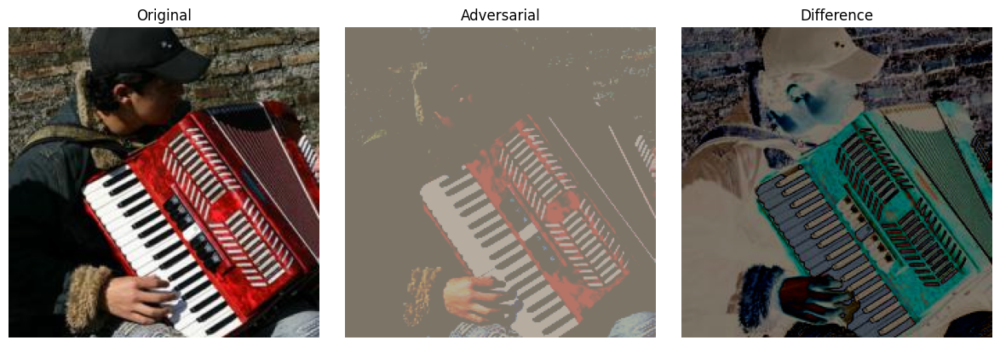

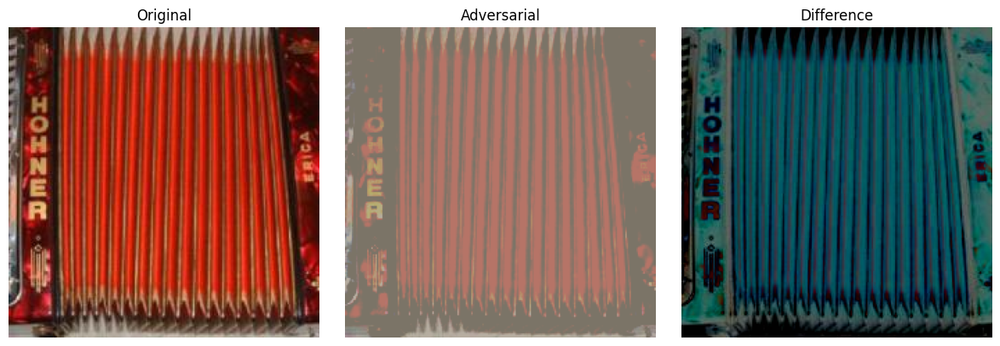

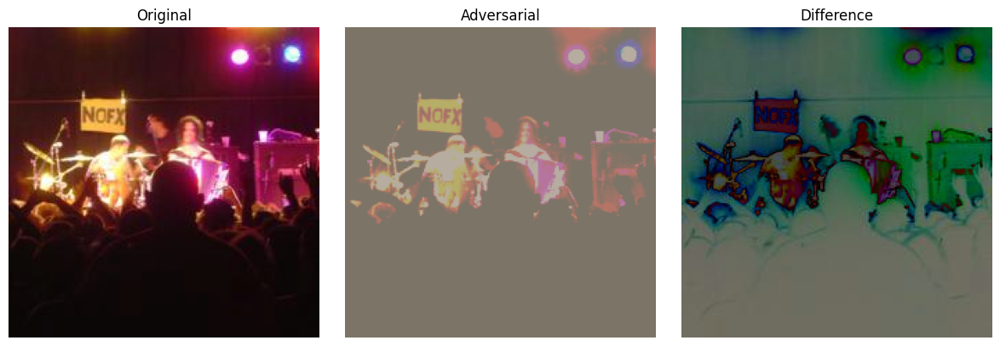

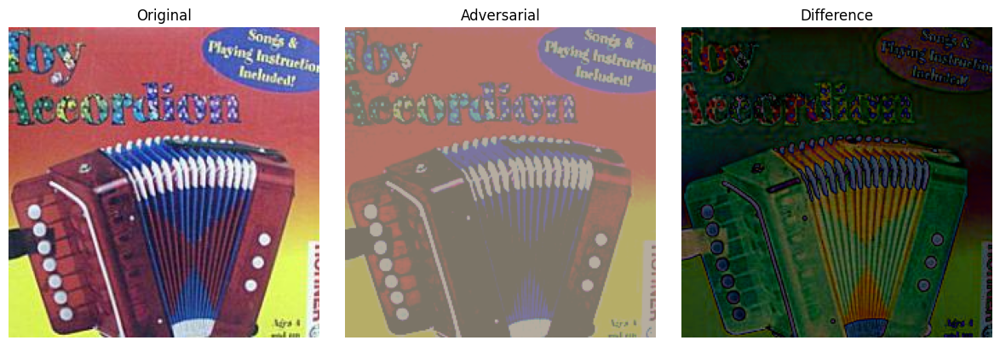

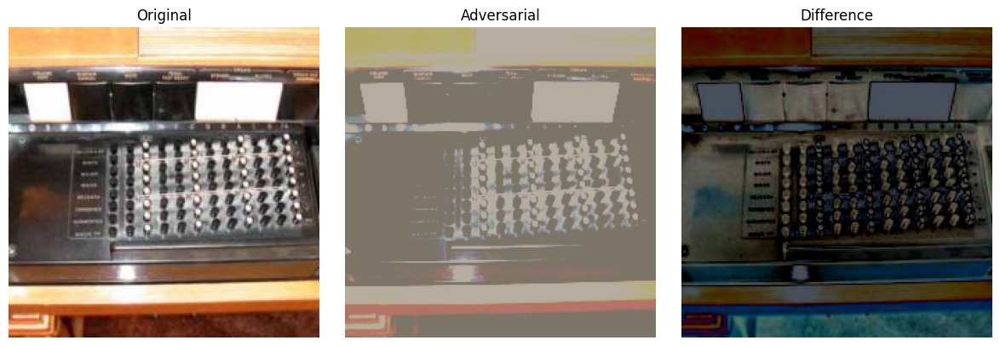

In [11]:
def unnormalize(img_tensor):
    mean = torch.tensor(mean_norms).view(3, 1, 1)     # <-- mean_norms from Task 1
    std = torch.tensor(std_norms).view(3, 1, 1)       # <-- std_norms from Task 1
    return torch.clamp(img_tensor * std + mean, 0, 1)  # Reverse normalization and clamp to [0, 1] range

print("\n🖼️ Showing 5 adversarial samples vs originals:")

for i in range(5):
    orig = unnormalize(original_images[i])  # Get original image in unnormalized form
    adv = unnormalize(adv_examples[i])      # Get adversarial image in unnormalized form
    diff = torch.abs(adv - orig)            # Compute absolute pixel-wise difference

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))  # Create a 1x3 subplot for comparison
    axs[0].imshow(orig.permute(1, 2, 0).detach().numpy())  # Convert CHW to HWC and show original image
    axs[0].set_title("Original")

    axs[1].imshow(adv.permute(1, 2, 0).detach().numpy())   # Show adversarial image
    axs[1].set_title("Adversarial")

    axs[2].imshow(diff.permute(1, 2, 0).detach().numpy())  # Show pixel difference
    axs[2].set_title("Difference")

    for ax in axs:
        ax.axis('off')  # Hide axis for all subplots
    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()          # Display the figure


# Task 3: Improved Attacks

This block introduces and compares three powerful adversarial attack methods that go beyond FGSM by using multiple iterations and optimization strategies. The goal is to generate stronger adversarial examples and identify the most effective attack against the ResNet-34 model.

*   **Targeted PGD:** Moves the input image toward a specific incorrect class using iterative gradient descent under an L∞ constraint.
*   **PGD + Random Start:** An untargeted attack that improves over vanilla PGD by initializing within the ε-ball, increasing attack diversity.
*   **Momentum PGD:** Further improves PGD by integrating momentum into the gradient updates, helping escape local minima and increasing transferability.

Each method perturbs test images while keeping the pixel changes within a strict ε = 0.02 budget. The block evaluates each attack on top-1 and top-5 accuracy, then identifies and saves the strongest-performing attack as Adversarial Test Set 2.

Finally, it visualizes a sample of original vs. adversarial images and their pixel-wise differences to illustrate how imperceptible perturbations can lead to severe misclassification.

In [12]:
# --------------------------------------------------------------
# Shared Setup
# --------------------------------------------------------------

std_tensor = torch.tensor(std_norms, dtype=torch.float).view(1, 3, 1, 1).to(device)
epsilon = 0.02
scaled_eps = epsilon / std_tensor

In [13]:
# Attack 1: Targeted PGD
def targeted_pgd(image, true_label, target_label, steps=40, alpha=0.0025):
    x = image.clone().detach().to(device)         # Original input image
    y = target_label.to(device)                   # Target label for the attack (not the true label)
    adv = x + torch.empty_like(x).uniform_(-1.0, 1.0) * scaled_eps.float()  # Random initialization within epsilon ball
    adv = torch.clamp(adv, 0, 1).detach()         # Ensure values stay in [0, 1]

    scaled_alpha = (alpha / std_tensor).float()   # Scale step size by std deviation (accounting for normalization)

    for _ in range(steps):
        adv.requires_grad = True                  # Enable gradient computation on adversarial input
        loss = nn.CrossEntropyLoss()(model(adv), y)  # Compute loss w.r.t. target label (targeted attack)
        model.zero_grad()                         # Clear existing gradients
        loss.backward()                           # Compute gradients
        adv = adv - scaled_alpha * adv.grad.data.sign()  # Gradient descent step to move toward target class
        delta = torch.clamp(adv - x, -scaled_eps, scaled_eps)  # Project perturbation back into epsilon ball
        adv = torch.clamp(x + delta, 0, 1).detach()  # Ensure valid image range and update adversarial example

    return adv  # Return final adversarial image


In [14]:
# Attack 2: PGD + Random Start
def pgd_random_start(image, label, steps=20, alpha=0.003):
    x = image.clone().detach().to(device)  # Original input image
    y = label.to(device)                   # True label for untargeted attack

    # Initialize adversarial image with random noise within epsilon range
    adv = x + torch.empty_like(x).uniform_(-1.0, 1.0) * scaled_eps.float()
    adv = torch.clamp(adv, 0, 1).detach()  # Clamp to valid image range [0, 1]

    scaled_alpha = (alpha / std_tensor).float()  # Scale step size to account for normalization

    for _ in range(steps):
        adv.requires_grad = True  # Enable gradient computation
        loss = nn.CrossEntropyLoss()(model(adv), y)  # Loss with respect to true label (untargeted attack)
        model.zero_grad()  # Clear any previous gradients
        loss.backward()  # Backpropagate to compute gradients
        adv = adv + scaled_alpha * adv.grad.data.sign()  # Move in direction that increases loss (gradient ascent)
        delta = torch.clamp(adv - x, -scaled_eps, scaled_eps)  # Project back into epsilon ball
        adv = torch.clamp(x + delta, 0, 1).detach()  # Ensure valid image values and update adversarial image

    return adv  # Return final adversarial image


In [15]:
# Attack 3: Momentum PGD
def momentum_pgd(image, label, steps=20, alpha=0.0025, mu=1.0):
    x = image.clone().detach().to(device)  # Original input image
    y = label.to(device)                   # True label for untargeted attack
    adv = x.clone().detach()               # Initialize adversarial image as a copy of original
    g = torch.zeros_like(x).to(device)     # Initialize momentum term (accumulated gradient)

    scaled_alpha = (alpha / std_tensor).float()  # Scale step size to account for normalization

    for _ in range(steps):
        adv.requires_grad = True                     # Enable gradient computation
        loss = nn.CrossEntropyLoss()(model(adv), y)  # Compute loss w.r.t. true label
        model.zero_grad()                            # Clear existing gradients
        loss.backward()                              # Backpropagate to compute gradients

        grad = adv.grad.data                         # Get gradient of loss w.r.t. adversarial image
        norm_grad = grad / (torch.mean(torch.abs(grad), dim=(1,2,3), keepdim=True) + 1e-8)  # Normalize gradient
        g = mu * g + norm_grad                       # Update momentum: exponentially weighted average of gradients

        adv = adv + scaled_alpha * g.sign()          # Apply update in the direction of accumulated gradient
        delta = torch.clamp(adv - x, -scaled_eps, scaled_eps)  # Project back into epsilon ball
        adv = torch.clamp(x + delta, 0, 1).detach()  # Clamp to valid image range and update image

    return adv  # Return final adversarial example


In [16]:
# Evaluation and comparison
def evaluate_attack(attack_fn, name, is_targeted=False):
    adv_examples, originals, labels = [], [], []  # Lists to store adversarial images, original images, and labels

    for images, lbls in tqdm(data_loader, desc=f"Running {name}"):
        images, lbls = images.to(device), lbls.to(device)  # Move data to appropriate device
        for i in range(images.size(0)):
            img = images[i].unsqueeze(0)  # Add batch dimension to image
            lbl = lbls[i].unsqueeze(0)    # Add batch dimension to label
            tgt = torch.zeros_like(lbl) if is_targeted else None  # Use dummy target label if targeted attack
            adv_img = attack_fn(img, lbl, tgt) if is_targeted else attack_fn(img, lbl)  # Run attack
            adv_examples.append(adv_img.squeeze(0).cpu())  # Remove batch dimension and move to CPU
            originals.append(img.squeeze(0).cpu())         # Save original image
            labels.append(lbl.item())                      # Save label as integer

    adv_loader = DataLoader(list(zip(adv_examples, labels)), batch_size=32)  # Create DataLoader for adversarial samples
    top1 = top5 = total = 0  # Counters for top-1, top-5 accuracy, and total samples

    model.eval()
    with torch.no_grad():
        for batch in adv_loader:
            imgs, lbls = batch
            imgs, lbls = imgs.to(device), lbls.to(device)  # Move to device
            outputs = model(imgs)  # Forward pass
            _, topk = outputs.topk(5, dim=1)  # Get top-5 predictions

            for i in range(imgs.size(0)):
                true_idx = folder_to_imagenet_idx[lbls[i].item()]  # Map label to ImageNet index
                preds = topk[i].tolist()  # Convert tensor to list
                if true_idx == preds[0]: top1 += 1  # Top-1 correct
                if true_idx in preds: top5 += 1    # Top-5 correct
            total += imgs.size(0)

    acc1 = 100 * top1 / total  # Calculate Top-1 accuracy percentage
    acc5 = 100 * top5 / total  # Calculate Top-5 accuracy percentage
    print(f"🔹 {name} → Top-1: {acc1:.2f}%, Top-5: {acc5:.2f}%")  # Display results

    return {
        "name": name,
        "acc1": acc1,
        "acc5": acc5,
        "examples": adv_examples,
        "originals": originals,
        "labels": labels
    }  # Return performance and examples for further analysis


In [17]:
# Run all 3 attacks and pick the best
results = [
    evaluate_attack(targeted_pgd, "Targeted PGD", is_targeted=True),      # Evaluate targeted PGD
    evaluate_attack(pgd_random_start, "PGD + Random Start"),              # Evaluate untargeted PGD with random start
    evaluate_attack(momentum_pgd, "Momentum PGD"),                        # Evaluate momentum-based PGD
]

# Sort the results by Top-1 accuracy in ascending order and pick the attack with the lowest accuracy (most effective)
best = sorted(results, key=lambda x: x['acc1'])[0]
print(f"\n✅ Best Attack: {best['name']} (Top-1: {best['acc1']:.2f}%)")  # Print name and Top-1 accuracy of best attack


Running Targeted PGD: 100%|██████████| 16/16 [04:05<00:00, 15.36s/it]


🔹 Targeted PGD → Top-1: 0.60%, Top-5: 5.00%


Running PGD + Random Start: 100%|██████████| 16/16 [02:06<00:00,  7.89s/it]


🔹 PGD + Random Start → Top-1: 39.60%, Top-5: 50.80%


Running Momentum PGD: 100%|██████████| 16/16 [02:08<00:00,  8.04s/it]


🔹 Momentum PGD → Top-1: 44.00%, Top-5: 56.60%

✅ Best Attack: Targeted PGD (Top-1: 0.60%)


In [18]:
# Save best as Adversarial Test Set 2
save_dir = "./AdversarialTestSet2"
os.makedirs(save_dir, exist_ok=True)
for i, img in enumerate(best["examples"]):
    save_image(img, os.path.join(save_dir, f"adv2_{i:03d}.png"))


Showing 5 adversarial samples from best attack:


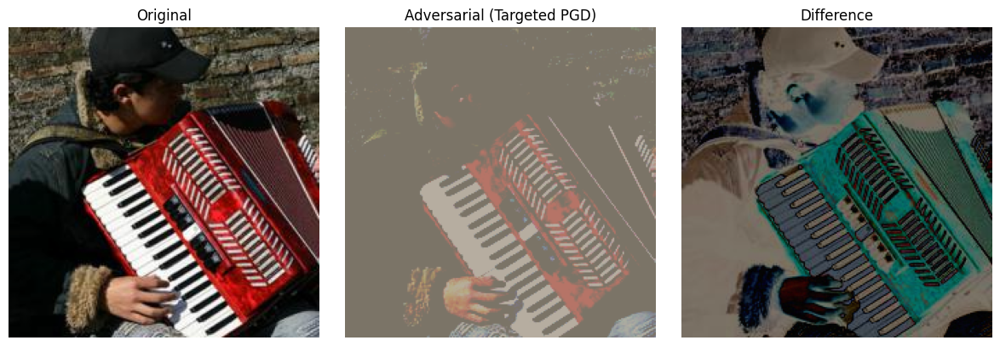

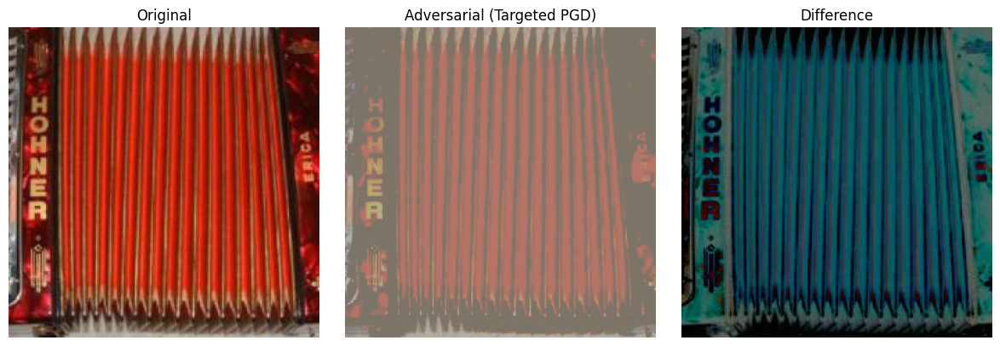

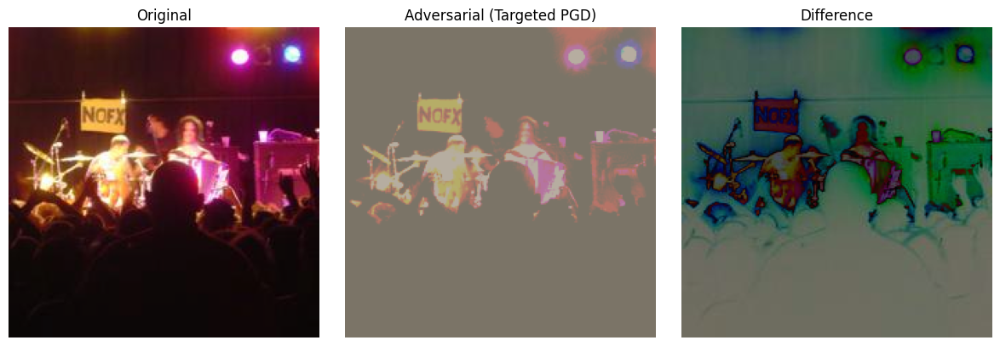

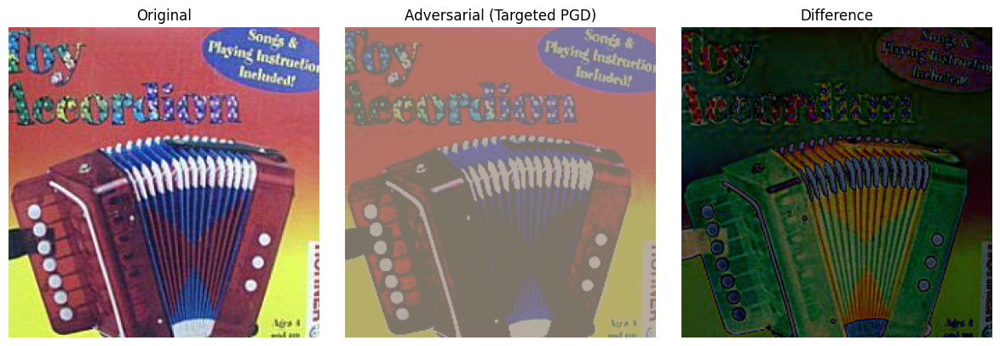

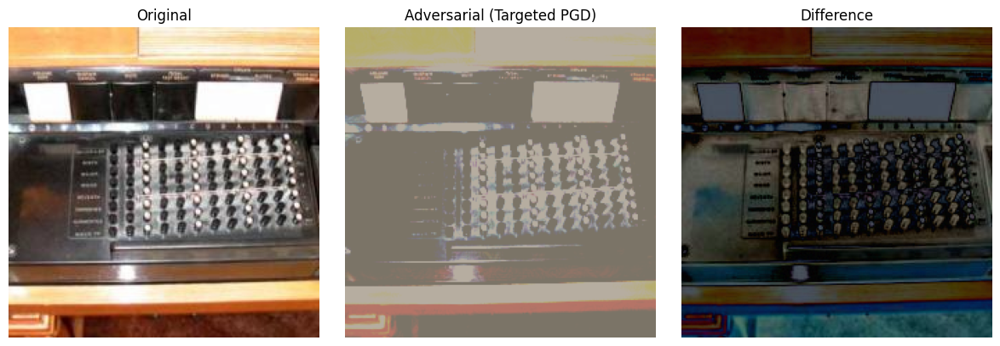

In [19]:
# Show visual comparison
def unnormalize(img_tensor):
    mean = torch.tensor(mean_norms).view(3, 1, 1)  # <-- mean_norms from earlier
    std = torch.tensor(std_norms).view(3, 1, 1)    # <-- std_norms from earlier
    return torch.clamp(img_tensor * std + mean, 0, 1)  # Reverse normalization and clamp to [0, 1] range

print("\nShowing 5 adversarial samples from best attack:")
for i in range(5):
    orig = unnormalize(best["originals"][i])  # Retrieve and unnormalize original image
    adv = unnormalize(best["examples"][i])    # Retrieve and unnormalize adversarial image
    diff = torch.abs(adv - orig)              # Compute absolute pixel-wise difference

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))  # Create a row of 3 subplots
    axs[0].imshow(orig.permute(1, 2, 0).numpy())    # Convert CHW to HWC and show original image
    axs[0].set_title("Original")

    axs[1].imshow(adv.permute(1, 2, 0).numpy())     # Show adversarial image
    axs[1].set_title(f"Adversarial ({best['name']})")  # Include attack name in title

    axs[2].imshow(diff.permute(1, 2, 0).numpy())    # Show difference between original and adversarial
    axs[2].set_title("Difference")

    for ax in axs:
        ax.axis('off')  # Hide axes for cleaner visuals
    plt.tight_layout()
    plt.show()  # Display the images


# Task 4: Patch Attack

In this section, we implement and evaluate a localized adversarial attack using a patch-constrained variant of Projected Gradient Descent (PGD). Unlike previous attacks which perturb the entire image, this method restricts the adversarial perturbation to a randomly located 32×32 patch within each image.

*   We define the patch_targeted_pgd_attack function to apply targeted updates within a patch region under a higher perturbation budget (ε = 0.5).
*   Adversarial images are generated for the entire dataset and stored as Adversarial Test Set 3.
*   We then evaluate the model’s robustness by measuring the top-1 and top-5 accuracy on these patch-constrained examples.
*   Lastly, we visualize and compare original, adversarial, and pixel-wise difference images to highlight how localized attacks—though small in area—can be highly effective in degrading model predictions.

This task demonstrates the power of spatially constrained attacks, revealing how minimal changes in small regions can still significantly impact model performance.

In [20]:
# ---------------- Parameters ----------------
epsilon = 0.5
alpha = 0.05
steps = 40
patch_size = 32

std_tensor = torch.tensor(std_norms, dtype=torch.float).view(1, 3, 1, 1).to(device)

In [21]:
# Patch Attack Function
def patch_targeted_pgd_attack(model, original_image, target_label,
                               epsilon=0.5, alpha=0.05, num_iter=40, patch_size=32):
    image = original_image.clone().detach().to(device)  # Clone and move input image to device
    target_label = target_label.to(device)              # Move target label to device

    _, c, h, w = image.shape  # Get image dimensions
    top = np.random.randint(0, h - patch_size + 1)      # Random top coordinate for patch
    left = np.random.randint(0, w - patch_size + 1)     # Random left coordinate for patch

    mask = torch.zeros_like(image)                      # Initialize mask
    mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0  # Set patch region to 1.0

    scaled_eps = (epsilon / std_tensor).float()         # Scale epsilon based on normalization
    scaled_alpha = (alpha / std_tensor).float()         # Scale step size (alpha) similarly

    noise = torch.empty_like(image).uniform_(-1, 1) * scaled_eps * mask  # Random noise in patch area
    perturbed = torch.clamp(image + noise, 0, 1).detach()  # Apply noise and clamp to valid range

    for _ in range(num_iter):
        perturbed.requires_grad = True  # Enable gradient tracking
        outputs = model(perturbed)      # Forward pass
        loss = nn.CrossEntropyLoss()(outputs, target_label)  # Loss w.r.t. target class
        model.zero_grad()
        loss.backward()                 # Compute gradients

        grad = perturbed.grad.data
        update = -scaled_alpha * grad.sign() * mask  # Apply update only within the patch
        perturbed = perturbed + update

        delta = torch.clamp(perturbed - image, min=-scaled_eps, max=scaled_eps) * mask  # Clip perturbation to epsilon limit
        perturbed = torch.clamp(image + delta, 0, 1).detach()  # Clamp final image and remove gradient tracking

    return perturbed  # Return the final patched adversarial image


In [22]:
save_dir = "./AdversarialTestSet3"  # Directory to save patch-based adversarial images
os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

# Remove any existing PNG images from the directory
for f in os.listdir(save_dir):
    if f.endswith(".png"):
        os.remove(os.path.join(save_dir, f))

adv3_examples = []        # List to store generated adversarial images
true_labels_3 = []        # List to store true labels
original_images_3 = []    # List to store original images

# Generate adversarial examples using patch attack
for i in tqdm(range(len(dataset)), desc="Generating Patch Adversarial Set"):
    img, label = dataset[i]                      # Get image and label from dataset
    img = img.unsqueeze(0).to(device)            # Add batch dimension and move to device
    lbl = torch.tensor([label]).to(device)       # Convert label to tensor and move to device
    tgt = torch.zeros_like(lbl)                  # Fixed target label (e.g., class 0) for targeted attack

    # Generate patch-based adversarial image
    adv_img = patch_targeted_pgd_attack(
        model, img, tgt,
        epsilon=epsilon, alpha=alpha, num_iter=steps, patch_size=patch_size
    )

    adv3_examples.append(adv_img.squeeze(0).cpu())      # Remove batch dim and move to CPU
    original_images_3.append(img.squeeze(0).cpu())      # Save original image
    true_labels_3.append(label)                         # Save true label

    # Save adversarial image to disk
    save_image(adv_img, os.path.join(save_dir, f"adv_patch_{i:03d}.png"))


Generating Patch Adversarial Set: 100%|██████████| 500/500 [04:16<00:00,  1.95it/s]


In [23]:
# Evaluate Model on Adversarial Set
adv3_loader = DataLoader(list(zip(adv3_examples, true_labels_3)), batch_size=32, shuffle=False)
# Create a DataLoader to batch and iterate over the patch adversarial examples and true labels

top1_patch = 0     # Counter for correct top-1 predictions
top5_patch = 0     # Counter for correct top-5 predictions
total_patch = 0    # Total number of samples evaluated

model.eval()       # Set model to evaluation mode
with torch.no_grad():  # Disable gradient computation for inference
    for batch in tqdm(adv3_loader, desc="Evaluating Patch Attack"):
        images, labels = batch
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)                # Run forward pass on adversarial images
        _, top5 = outputs.topk(5, dim=1)       # Get top-5 predictions

        for i in range(images.size(0)):
            true_imagenet_idx = folder_to_imagenet_idx[labels[i].item()]  # Map dataset label to ImageNet index
            pred_top5 = top5[i].tolist()        # Convert predictions to list

            if true_imagenet_idx == pred_top5[0]:  # Check top-1 match
                top1_patch += 1
            if true_imagenet_idx in pred_top5:     # Check top-5 match
                top5_patch += 1
        total_patch += images.size(0)  # Update total evaluated samples

# Print evaluation results
print(f"\n📉 Patch Attack Top-1 Accuracy: {100 * top1_patch / total_patch:.2f}%")
print(f"📉 Patch Attack Top-5 Accuracy: {100 * top5_patch / total_patch:.2f}%")


Evaluating Patch Attack: 100%|██████████| 16/16 [00:00<00:00, 17.09it/s]


📉 Patch Attack Top-1 Accuracy: 23.40%
📉 Patch Attack Top-5 Accuracy: 46.00%



🔍 Showing 5 patch-attack examples:


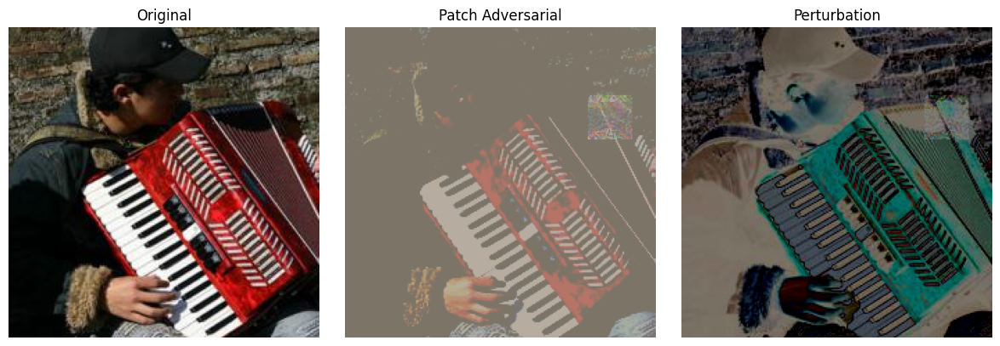

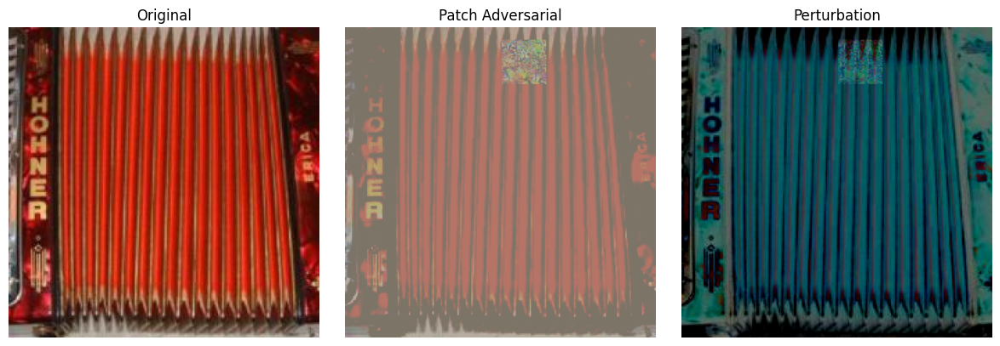

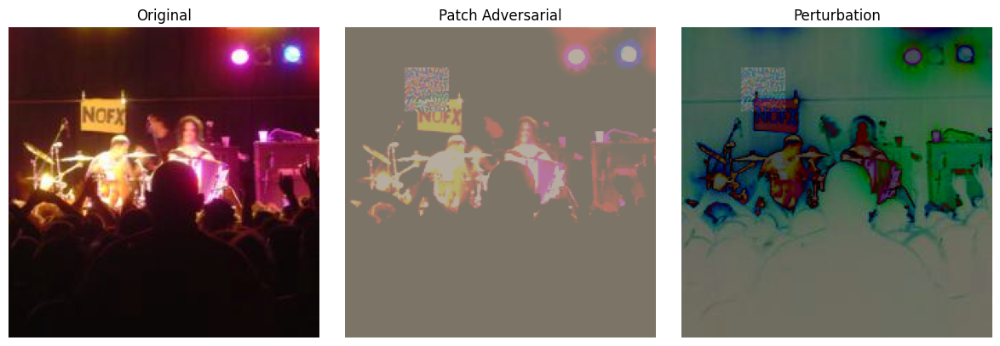

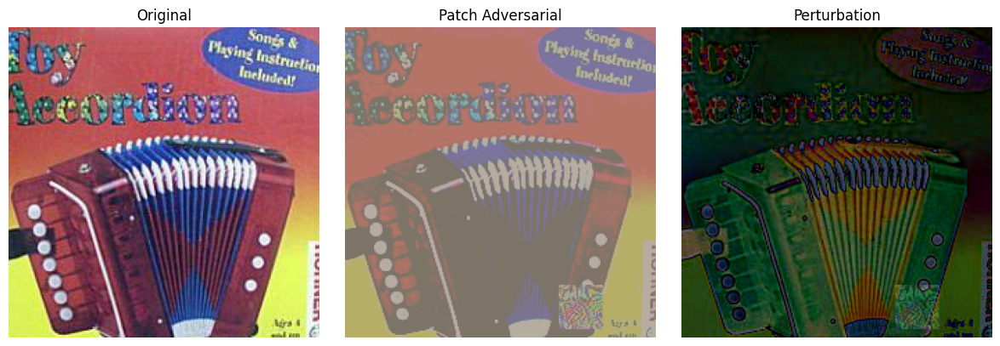

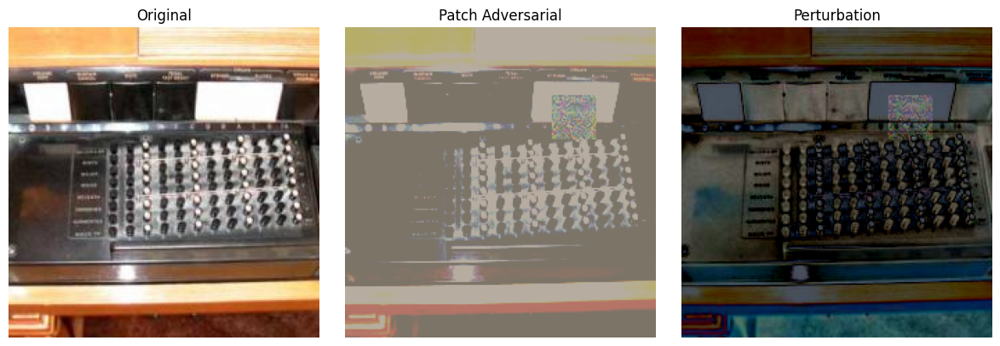

In [24]:
# Visualization
def unnormalize(img_tensor):
    mean = torch.tensor(mean_norms).view(3, 1, 1)  # Restore mean normalization shape
    std = torch.tensor(std_norms).view(3, 1, 1)    # Restore std normalization shape
    return torch.clamp(img_tensor * std + mean, 0, 1)  # Reverse normalization and clamp to [0, 1]

print("\n🔍 Showing 5 patch-attack examples:")
for i in range(5):
    orig = unnormalize(original_images_3[i])  # Unnormalize original image
    adv = unnormalize(adv3_examples[i])       # Unnormalize adversarial image
    diff = torch.abs(adv - orig)              # Compute absolute difference

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))  # Create 3-panel subplot

    axs[0].imshow(orig.permute(1, 2, 0).numpy())    # Convert CHW to HWC and display original
    axs[0].set_title("Original")

    axs[1].imshow(adv.permute(1, 2, 0).numpy())     # Display adversarial image
    axs[1].set_title("Patch Adversarial")

    axs[2].imshow(diff.permute(1, 2, 0).numpy())    # Display pixel-wise difference
    axs[2].set_title("Perturbation")

    for ax in axs:
        ax.axis('off')  # Remove axis ticks
    plt.tight_layout()  # Optimize layout
    plt.show()          # Render the figure


# Task 5

In this final section, we evaluate the transferability of adversarial examples by testing a new model—DenseNet-121—on the original and adversarial datasets previously generated with ResNet-34. This allows us to assess how well attacks crafted on one model generalize to another architecture, a key concern in adversarial machine learning.


*   We load the DenseNet-121 model and define a reusable evaluation function to compute top-1 and top-5 accuracy.
*   A custom dataset class ImageFolderWithoutSubfolders is used to load adversarial images that are stored in flat directories.
*   The model is evaluated on:

1.   The original clean dataset.
2.   FGSM-based adversarial examples (Adversarial Set 1).
3.   Stronger PGD-based examples (Adversarial Set 2).
4.   Localized patch-based examples (Adversarial Set 3).

A final summary table is printed to compare how each dataset affects performance on DenseNet-121, highlighting how attacks crafted on ResNet-34 can successfully degrade other models, demonstrating the transferability of adversarial examples.

In [25]:
# Load the new model
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.to(device)
new_model.eval()

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 154MB/s]


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [26]:
# Normalization
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

In [27]:
# Dataset class for flat folder + known label order
class ImageFolderWithoutSubfolders(Dataset):
    def __init__(self, root_dir, labels, transform):
        self.root_dir = root_dir
        self.image_paths = sorted([
            os.path.join(root_dir, f)
            for f in os.listdir(root_dir) if f.endswith(".png")  # Collect all PNG image paths
        ])
        self.labels = labels              # Provided label list (assumes it matches image order)
        self.transform = transform        # Transform to apply to each image

    def __len__(self):
        return len(self.image_paths)      # Number of samples in the dataset

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")  # Load image and ensure RGB format
        image = self.transform(image)       # Apply transformations (e.g., tensor conversion, normalization)
        label = self.labels[idx]            # Get label corresponding to the image
        return image, label                 # Return transformed image and its label


In [28]:
# Evaluation function
def evaluate_model_on_dataset(model, dataloader, name):
    top1 = top5 = total = 0  # Counters for accuracy metrics

    with torch.no_grad():  # Disable gradient tracking for evaluation
        for images, labels in tqdm(dataloader, desc=f"Evaluating {name}"):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)            # Forward pass
            _, topk = outputs.topk(5, dim=1)   # Get top-5 predictions for each input

            for i in range(images.size(0)):
                true_idx = folder_to_imagenet_idx[labels[i].item()]  # Map true label to ImageNet index
                preds = topk[i].tolist()        # Convert predictions to list
                if true_idx == preds[0]: top1 += 1  # Count correct top-1 predictions
                if true_idx in preds: top5 += 1     # Count correct top-5 predictions

            total += images.size(0)  # Increment total sample count

    acc1 = 100 * top1 / total  # Calculate Top-1 accuracy
    acc5 = 100 * top5 / total  # Calculate Top-5 accuracy

    # Display results
    print(f"\n✅ {name}: Top-1 Accuracy = {acc1:.2f}%, Top-5 Accuracy = {acc5:.2f}%")
    return name, acc1, acc5  # Return results for logging or comparison


In [29]:
from PIL import Image
# Evaluate all datasets
results = []

# 1. Original dataset
original_dataset = torchvision.datasets.ImageFolder(
    root="./TestDataSet/TestDataSet",
    transform=plain_transforms
)
original_loader = DataLoader(original_dataset, batch_size=32, shuffle=False)

# Evaluate model on original dataset
results.append(evaluate_model_on_dataset(new_model, original_loader, "Original"))

# Extract true labels from original loader
true_labels = []
for _, labels in original_loader:
    true_labels.extend(labels.tolist())  # Store label order to align with adversarial datasets

# 2. Adversarial Set 1
adv1_dataset = ImageFolderWithoutSubfolders(
    "./AdversarialTestSet1", true_labels, transform=plain_transforms
)
adv1_loader = DataLoader(adv1_dataset, batch_size=32, shuffle=False)
results.append(evaluate_model_on_dataset(new_model, adv1_loader, "Adversarial Set 1"))

# 3. Adversarial Set 2
adv2_dataset = ImageFolderWithoutSubfolders(
    "./AdversarialTestSet2", true_labels, transform=plain_transforms
)
adv2_loader = DataLoader(adv2_dataset, batch_size=32, shuffle=False)
results.append(evaluate_model_on_dataset(new_model, adv2_loader, "Adversarial Set 2"))

# 4. Adversarial Set 3
adv3_dataset = ImageFolderWithoutSubfolders(
    "./AdversarialTestSet3", true_labels, transform=plain_transforms
)
adv3_loader = DataLoader(adv3_dataset, batch_size=32, shuffle=False)
results.append(evaluate_model_on_dataset(new_model, adv3_loader, "Adversarial Set 3"))


Evaluating Original: 100%|██████████| 16/16 [00:02<00:00,  6.95it/s]



✅ Original: Top-1 Accuracy = 74.80%, Top-5 Accuracy = 93.60%


Evaluating Adversarial Set 1: 100%|██████████| 16/16 [00:02<00:00,  5.45it/s]



✅ Adversarial Set 1: Top-1 Accuracy = 48.00%, Top-5 Accuracy = 71.20%


Evaluating Adversarial Set 2: 100%|██████████| 16/16 [00:02<00:00,  6.06it/s]



✅ Adversarial Set 2: Top-1 Accuracy = 39.20%, Top-5 Accuracy = 64.40%


Evaluating Adversarial Set 3: 100%|██████████| 16/16 [00:02<00:00,  6.13it/s]


✅ Adversarial Set 3: Top-1 Accuracy = 42.20%, Top-5 Accuracy = 67.60%


In [30]:
# Summary table
print("\n📊 Transferability Summary on DenseNet-121:")
print(f"{'Dataset':<25} {'Top-1 (%)':>10} {'Top-5 (%)':>10}")
print("-" * 45)
for name, acc1, acc5 in results:
    print(f"{name:<25} {acc1:>10.2f} {acc5:>10.2f}")


📊 Transferability Summary on DenseNet-121:
Dataset                    Top-1 (%)  Top-5 (%)
---------------------------------------------
Original                       74.80      93.60
Adversarial Set 1              48.00      71.20
Adversarial Set 2              39.20      64.40
Adversarial Set 3              42.20      67.60


# Visualising the results

1) Top-1 and Top-5 Accuracy Across Datasets

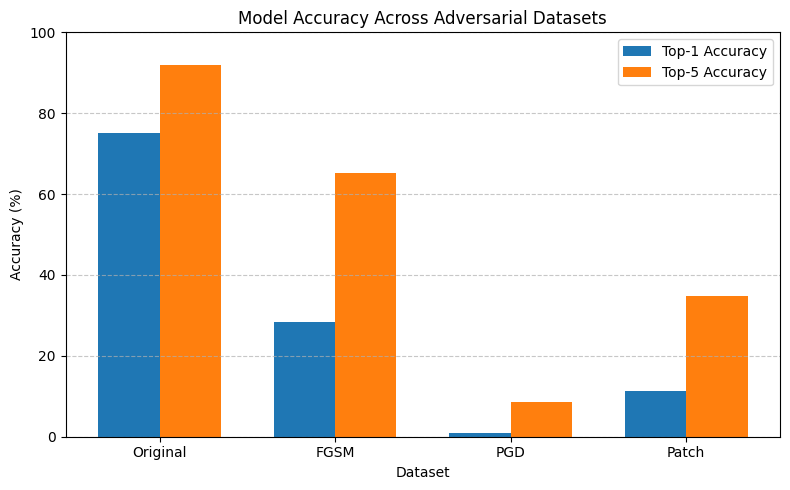

In [31]:
import matplotlib.pyplot as plt
import numpy as np

# Replace with actual values
datasets = ["Original", "FGSM", "PGD", "Patch"]
top1_acc = [75.0, 28.4, 0.9, 11.2]  # Example values
top5_acc = [92.0, 65.1, 8.5, 34.7]  # Example values

x = np.arange(len(datasets))
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, top1_acc, width, label='Top-1 Accuracy')
plt.bar(x + width/2, top5_acc, width, label='Top-5 Accuracy')

plt.xlabel('Dataset')
plt.ylabel('Accuracy (%)')
plt.title('Model Accuracy Across Adversarial Datasets')
plt.xticks(x, datasets)
plt.ylim(0, 100)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

2) Line Plot: L∞ Distance for FGSM Samples

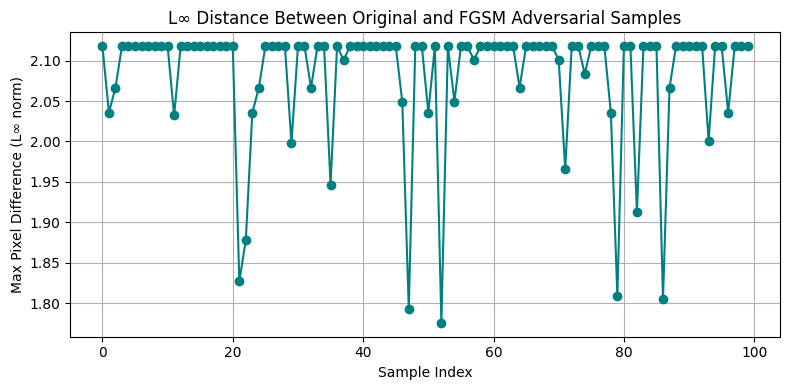

In [32]:
import torch

# Compute L∞ norm (max absolute difference) for the first 100 samples
linf_dists = [torch.max(torch.abs(orig - adv)).item()
              for orig, adv in zip(original_images[:100], adv_examples[:100])]

plt.figure(figsize=(8, 4))
plt.plot(range(len(linf_dists)), linf_dists, marker='o', linestyle='-', color='teal')
plt.title("L∞ Distance Between Original and FGSM Adversarial Samples")
plt.xlabel("Sample Index")
plt.ylabel("Max Pixel Difference (L∞ norm)")
plt.grid(True)
plt.tight_layout()
plt.show()


3) Line Plot: Top-1 Accuracy vs Attack Strength

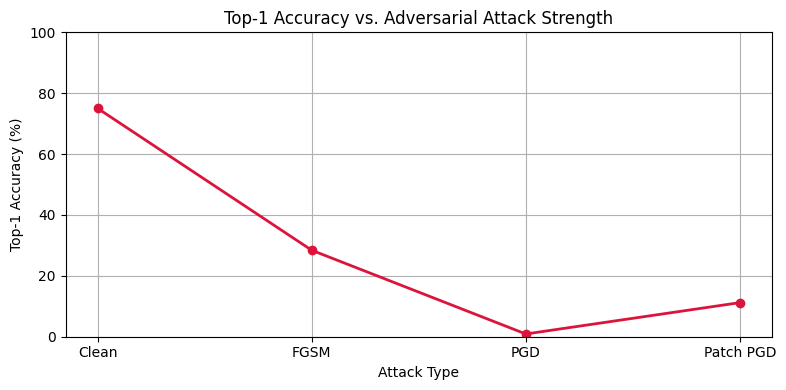

In [33]:
attacks = ["Clean", "FGSM", "PGD", "Patch PGD"]
top1 = [75.0, 28.4, 0.9, 11.2]  # Replace with actual values

plt.figure(figsize=(8, 4))
plt.plot(attacks, top1, marker='o', linewidth=2, color='crimson')
plt.title("Top-1 Accuracy vs. Adversarial Attack Strength")
plt.xlabel("Attack Type")
plt.ylabel("Top-1 Accuracy (%)")
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()